The gradient magnitude of image:  [[ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 ...
 [ 0.    15.1   11.49  ...  8.125 11.31  12.805]
 [ 8.     6.    12.805 ...  6.324 11.49   0.   ]
 [ 0.     2.    11.49  ...  8.     6.     0.   ]]
The gradient direction of image : [[ 0.    0.    0.   ...  0.    0.    0.  ]
 [ 0.    0.    0.   ...  0.    0.    0.  ]
 [ 0.    0.    0.   ...  0.    0.    0.  ]
 ...
 [ 0.   40.88 26.98 ... 45.   45.    0.  ]
 [ 0.   30.84  7.91 ... 18.44 23.95  0.  ]
 [ 0.   90.   90.   ... 90.   90.    0.  ]]


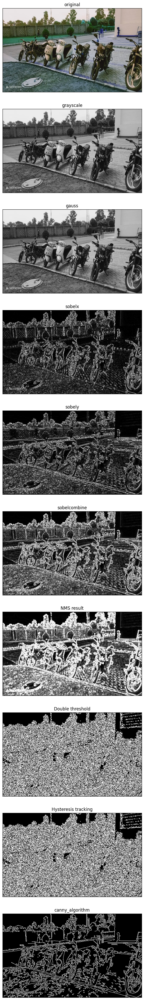

In [3]:
#we are going to use canny edge and by using this we are going to do these operation on our image:
# 1. noise reduction;
# 2.Gradient calculation;
# 3. Non-maximum suppression;
# 4.Double threshold;
# 5. Edge Tracking by Hysteresis.

#-------------------------------------------------------------reading image and converting in grayscale---------------------------------

import cv2
import numpy as np
img=cv2.imread("bikes.jpeg",1)  #loading images

img2=cv2.imread("bikes.jpeg",0)

img=cv2.resize(img,(500,300))  #resizing the images
img2=cv2.resize(img2,(500,300))

#showing images
cv2.imshow("original",img) 
cv2.imshow("Grayscaledimage",img2)
#-------------------------------------------------------------Noise-reduction--------------------------------

#Firstly we will do noise reduction from images using canny edge algorithm which use the GAUSSIAN Blur function
#GAUSSIAN blur - it uses different weight kernel,in row as well as column--means side values are small then centre.
#it manages distance between pixels
gaussian=cv2.GaussianBlur(img2,(1,1),0)
cv2.imshow("Gaussian applied",gaussian)

#-------------------------------------------------------------Gradient--calculation---------------------------------
#now we are going to calculate gradient by using sobelx and sobel y
sobelx=cv2.Sobel(img2,cv2.CV_64F,1,0,ksize=3)
sobely=cv2.Sobel(img2,cv2.CV_64F,0,1,ksize=3)
sobelx=np.uint8(np.absolute(sobelx))
sobely=np.uint8(np.absolute(sobely))
sobelcombine=cv2.bitwise_or(sobelx,sobely)
cv2.imshow("sobelx",sobelx)
cv2.imshow("sobely",sobely)
cv2.imshow("combined sobel",sobelcombine)

# Calculate gradient magnitude
gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

# Calculate gradient direction (in degrees)
gradient_direction = np.arctan2(sobelx, sobely) * 180 / np.pi

print("The gradient magnitude of image: ",gradient_magnitude)
print("The gradient direction of image :",gradient_direction)


#-------------------------------------------------------------NMS(non maximal supression)---------------------------------

#now for NMS (non-maximal supression) we have inbuilt function of open cv called DILATE()
# NMS we do it to The main purpose of non-maximal suppression is to retain only the most significant or dominant responses 
#while suppressing or eliminating weaker or redundant responses.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)) 
NMS_img=cv2.dilate(sobelcombine, kernel, iterations=1)

cv2.imshow("NMS Result", NMS_img)

#-------------------------------------------------------------double threshold---------------------------------
#4. double threshhold
# use to distinguish between strong edges and weak edges in an edge map or gradient magnitude image.
low_threshold = 10  
upper_threshold = 50 

# Create a binary image where strong edges are white and weak edges are gray
strong_edges = (gradient_magnitude >= upper_threshold)
weak_edges = (gradient_magnitude >= low_threshold) & (gradient_magnitude < upper_threshold)
edge_map0 = np.zeros_like(NMS_img)
edge_map0[strong_edges] = 150  # Strong edges in white
edge_map0[weak_edges] = 50    # Weak edges in gray
cv2.imshow('Double threshold', edge_map0)

#-------------------------------------------------------------hysteresis--tracking---------------------------------

 #Hysteresis thresholding works by considering the strength of edges and their connectivity in the image
def tracking_hysteresis(edge_map0, strong_edges, weak_edges):
    rows, cols = edge_map0.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if edge_map0[i, j] == 128:  # Check if it's a weak edge pixel
                # Check the 8 neighboring pixels for strong edges
                if np.any(strong_edges[i - 1:i + 2, j - 1:j + 2]):
                    edge_map0[i, j] = 255  # Promote the weak edge to a strong edge

# Apply hysteresis thresholding to connect weak edges to strong edges
tracking_hysteresis(edge_map0, strong_edges, weak_edges)

# Display the original image and the resulting edge map
cv2.imshow("hysteresis tracking", edge_map0)

#------------------------------------------------------------- canny algorithm ---------------------------------------------------------
canny_image=cv2.Canny(img2,100,255)
#-------------------------------------------------------------ploting images---------------------------------


titles=["original","grayscale","gauss","sobelx","sobely","sobelcombine","NMS result","Double threshold","Hysteresis tracking","canny_algorithm"]
images=[img,img2,gaussian,sobelx,sobely,sobelcombine,NMS_img,edge_map0,edge_map0,canny_image]
#now plot all images in a graph
fig_width=50
fig_height=50
from matplotlib import pyplot as plt
plt.figure(figsize=(fig_width, fig_height))
for i in range(10):
   #plt.figure(figsize=(fig_width, fig_height))
   plt.subplot(10,1,i+1),
   plt.imshow(images[i],'gray')
   plt.title(titles[i])
   plt.xticks([]),plt.yticks([])
plt.show()
cv2.waitKey(10)
cv2.destroyAllWindows()


The gradient magnitude of image:  [[ 0.     0.     0.    ... 15.1   12.     0.   ]
 [ 0.     0.     1.414 ...  5.098 12.65   4.   ]
 [ 4.     4.     4.473 ... 11.05  12.65   4.   ]
 ...
 [ 8.    12.96  10.    ... 14.56  13.34  12.   ]
 [12.805  8.6   12.805 ... 10.77   1.414  4.   ]
 [ 0.     8.25  12.805 ...  8.     2.     0.   ]]
The gradient direction of image : [[ 0.    0.    0.   ... 90.   90.    0.  ]
 [ 0.    0.   45.   ... 82.6  78.7   0.  ]
 [ 0.    0.   26.56 ... 83.2  78.7   0.  ]
 ...
 [ 0.   27.36 30.67 ... 56.3  77.    0.  ]
 [ 0.   28.16 38.38 ... 68.25 45.    0.  ]
 [ 0.   90.   90.   ... 90.   90.    0.  ]]


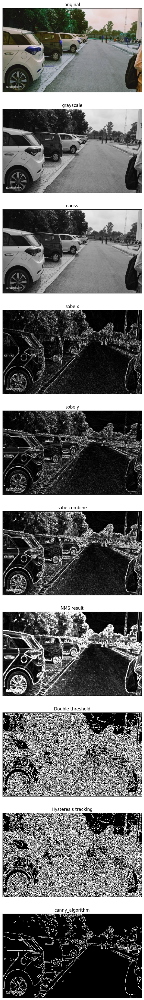

In [1]:
#Name=sumit kumar
#reg=7211815(B.tech cse 5th sem)


#we are going to use canny edge and by using this we are going to do these operation on our image:
# 1. noise reduction;
# 2.Gradient calculation;
# 3. Non-maximum suppression;
# 4.Double threshold;
# 5. Edge Tracking by Hysteresis.

#-------------------------------------------------------------reading image and converting in grayscale---------------------------------

import cv2
import numpy as np
img=cv2.imread("cars.jpeg",1)  #loading images

img2=cv2.imread("cars.jpeg",0)

img=cv2.resize(img,(500,300))  #resizing the images
img2=cv2.resize(img2,(500,300))

#showing images
cv2.imshow("original",img) 
cv2.imshow("Grayscaledimage",img2)
#-------------------------------------------------------------Noise-reduction--------------------------------

#Firstly we will do noise reduction from images using canny edge algorithm which use the GAUSSIAN Blur function
#GAUSSIAN blur - it uses different weight kernel,in row as well as column--means side values are small then centre.
#it manages distance between pixels
gaussian=cv2.GaussianBlur(img2,(1,1),0)
cv2.imshow("Gaussian applied",gaussian)

#-------------------------------------------------------------Gradient--calculation---------------------------------
#now we are going to calculate gradient by using sobelx and sobel y
sobelx=cv2.Sobel(img2,cv2.CV_64F,1,0,ksize=3)
sobely=cv2.Sobel(img2,cv2.CV_64F,0,1,ksize=3)
sobelx=np.uint8(np.absolute(sobelx))
sobely=np.uint8(np.absolute(sobely))
sobelcombine=cv2.bitwise_or(sobelx,sobely)
cv2.imshow("sobelx",sobelx)
cv2.imshow("sobely",sobely)
cv2.imshow("combined sobel",sobelcombine)

# Calculate gradient magnitude
gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

# Calculate gradient direction (in degrees)
gradient_direction = np.arctan2(sobelx, sobely) * 180 / np.pi

print("The gradient magnitude of image: ",gradient_magnitude)
print("The gradient direction of image :",gradient_direction)


#-------------------------------------------------------------NMS(non maximal supression)---------------------------------

#now for NMS (non-maximal supression) we have inbuilt function of open cv called DILATE()
# NMS we do it to The main purpose of non-maximal suppression is to retain only the most significant or dominant responses 
#while suppressing or eliminating weaker or redundant responses.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)) 
NMS_img=cv2.dilate(sobelcombine, kernel, iterations=1)

cv2.imshow("NMS Result", NMS_img)

#-------------------------------------------------------------double threshold---------------------------------
#4. double threshhold
# use to distinguish between strong edges and weak edges in an edge map or gradient magnitude image.
low_threshold = 10  
upper_threshold = 50 

# Create a binary image where strong edges are white and weak edges are gray
strong_edges = (gradient_magnitude >= upper_threshold)
weak_edges = (gradient_magnitude >= low_threshold) & (gradient_magnitude < upper_threshold)
edge_map0 = np.zeros_like(NMS_img)
edge_map0[strong_edges] = 150  # Strong edges in white
edge_map0[weak_edges] = 50    # Weak edges in gray
cv2.imshow('Double threshold', edge_map0)

#-------------------------------------------------------------hysteresis--tracking---------------------------------

 #Hysteresis thresholding works by considering the strength of edges and their connectivity in the image
def tracking_hysteresis(edge_map0, strong_edges, weak_edges):
    rows, cols = edge_map0.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if edge_map0[i, j] == 128:  # Check if it's a weak edge pixel
                # Check the 8 neighboring pixels for strong edges
                if np.any(strong_edges[i - 1:i + 2, j - 1:j + 2]):
                    edge_map0[i, j] = 255  # Promote the weak edge to a strong edge

# Apply hysteresis thresholding to connect weak edges to strong edges
tracking_hysteresis(edge_map0, strong_edges, weak_edges)

# Display the original image and the resulting edge map
cv2.imshow("hysteresis tracking", edge_map0)

#------------------------------------------------------------- canny algorithm ---------------------------------------------------------
canny_image=cv2.Canny(img2,150,255)
#-------------------------------------------------------------ploting images---------------------------------


titles=["original","grayscale","gauss","sobelx","sobely","sobelcombine","NMS result","Double threshold","Hysteresis tracking","canny_algorithm"]
images=[img,img2,gaussian,sobelx,sobely,sobelcombine,NMS_img,edge_map0,edge_map0,canny_image]
#now plot all images in a graph
fig_width=50
fig_height=50
from matplotlib import pyplot as plt
plt.figure(figsize=(fig_width, fig_height))
for i in range(10):
   #plt.figure(figsize=(fig_width, fig_height))
   plt.subplot(10,1,i+1),
   plt.imshow(images[i],'gray')
   plt.title(titles[i])
   plt.xticks([]),plt.yticks([])
plt.show()
cv2.waitKey(10)
cv2.destroyAllWindows()


The gradient magnitude of image:  [[ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 4.     4.     4.    ...  1.414  0.     0.   ]
 ...
 [ 6.     2.     8.945 ...  8.125  7.07  12.   ]
 [ 6.     5.832 10.    ...  4.    12.086  2.   ]
 [ 0.     2.    10.    ...  8.    12.805  0.   ]]
The gradient direction of image : [[ 0.    0.    0.   ...  0.    0.    0.  ]
 [ 0.    0.    0.   ...  0.    0.    0.  ]
 [ 0.    0.    0.   ... 45.    0.    0.  ]
 ...
 [ 0.    0.   26.56 ... 88.25 45.    0.  ]
 [ 0.   30.98 36.88 ... 14.92 19.5   0.  ]
 [ 0.   90.   90.   ... 90.   90.    0.  ]]


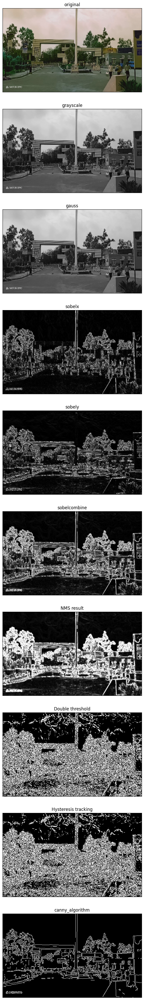

In [4]:
#we are going to use canny edge and by using this we are going to do these operation on our image:
# 1. noise reduction;
# 2.Gradient calculation;
# 3. Non-maximum suppression;
# 4.Double threshold;
# 5. Edge Tracking by Hysteresis.

#-------------------------------------------------------------reading image and converting in grayscale---------------------------------

import cv2
import numpy as np
img=cv2.imread("frontgate.jpeg",1)  #loading images

img2=cv2.imread("frontgate.jpeg",0)

img=cv2.resize(img,(500,300))  #resizing the images
img2=cv2.resize(img2,(500,300))

#showing images
cv2.imshow("original",img) 
cv2.imshow("Grayscaledimage",img2)
#-------------------------------------------------------------Noise-reduction--------------------------------

#Firstly we will do noise reduction from images using canny edge algorithm which use the GAUSSIAN Blur function
#GAUSSIAN blur - it uses different weight kernel,in row as well as column--means side values are small then centre.
#it manages distance between pixels
gaussian=cv2.GaussianBlur(img2,(1,1),0)
cv2.imshow("Gaussian applied",gaussian)

#-------------------------------------------------------------Gradient--calculation---------------------------------
#now we are going to calculate gradient by using sobelx and sobel y
sobelx=cv2.Sobel(img2,cv2.CV_64F,1,0,ksize=3)
sobely=cv2.Sobel(img2,cv2.CV_64F,0,1,ksize=3)
sobelx=np.uint8(np.absolute(sobelx))
sobely=np.uint8(np.absolute(sobely))
sobelcombine=cv2.bitwise_or(sobelx,sobely)
cv2.imshow("sobelx",sobelx)
cv2.imshow("sobely",sobely)
cv2.imshow("combined sobel",sobelcombine)

# Calculate gradient magnitude
gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

# Calculate gradient direction (in degrees)
gradient_direction = np.arctan2(sobelx, sobely) * 180 / np.pi

print("The gradient magnitude of image: ",gradient_magnitude)
print("The gradient direction of image :",gradient_direction)


#-------------------------------------------------------------NMS(non maximal supression)---------------------------------

#now for NMS (non-maximal supression) we have inbuilt function of open cv called DILATE()
# NMS we do it to The main purpose of non-maximal suppression is to retain only the most significant or dominant responses 
#while suppressing or eliminating weaker or redundant responses.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)) 
NMS_img=cv2.dilate(sobelcombine, kernel, iterations=1)

cv2.imshow("NMS Result", NMS_img)

#-------------------------------------------------------------double threshold---------------------------------
#4. double threshhold
# use to distinguish between strong edges and weak edges in an edge map or gradient magnitude image.
low_threshold = 10  
upper_threshold = 50 

# Create a binary image where strong edges are white and weak edges are gray
strong_edges = (gradient_magnitude >= upper_threshold)
weak_edges = (gradient_magnitude >= low_threshold) & (gradient_magnitude < upper_threshold)
edge_map0 = np.zeros_like(NMS_img)
edge_map0[strong_edges] = 150  # Strong edges in white
edge_map0[weak_edges] = 50    # Weak edges in gray
cv2.imshow('Double threshold', edge_map0)

#-------------------------------------------------------------hysteresis--tracking---------------------------------

 #Hysteresis thresholding works by considering the strength of edges and their connectivity in the image
def tracking_hysteresis(edge_map0, strong_edges, weak_edges):
    rows, cols = edge_map0.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if edge_map0[i, j] == 128:  # Check if it's a weak edge pixel
                # Check the 8 neighboring pixels for strong edges
                if np.any(strong_edges[i - 1:i + 2, j - 1:j + 2]):
                    edge_map0[i, j] = 255  # Promote the weak edge to a strong edge

# Apply hysteresis thresholding to connect weak edges to strong edges
tracking_hysteresis(edge_map0, strong_edges, weak_edges)

# Display the original image and the resulting edge map
cv2.imshow("hysteresis tracking", edge_map0)

#------------------------------------------------------------- canny algorithm ---------------------------------------------------------
canny_image=cv2.Canny(img2,150,255)
#-------------------------------------------------------------ploting images---------------------------------


titles=["original","grayscale","gauss","sobelx","sobely","sobelcombine","NMS result","Double threshold","Hysteresis tracking","canny_algorithm"]
images=[img,img2,gaussian,sobelx,sobely,sobelcombine,NMS_img,edge_map0,edge_map0,canny_image]
#now plot all images in a graph
fig_width=50
fig_height=50
from matplotlib import pyplot as plt
plt.figure(figsize=(fig_width, fig_height))
for i in range(10):
   #plt.figure(figsize=(fig_width, fig_height))
   plt.subplot(10,1,i+1),
   plt.imshow(images[i],'gray')
   plt.title(titles[i])
   plt.xticks([]),plt.yticks([])
plt.show()
cv2.waitKey(10)
cv2.destroyAllWindows()


The gradient magnitude of image:  [[ 0.     8.     8.    ... 11.49   6.     0.   ]
 [12.805 13.04  12.    ...  4.    13.34   0.   ]
 [ 4.     4.242 10.3   ... 10.    10.195  4.   ]
 ...
 [ 4.     6.     9.9   ... 12.96  12.96   0.   ]
 [ 8.    13.414  7.21  ... 10.    13.64   4.   ]
 [ 0.    10.     6.    ...  4.    12.805  0.   ]]
The gradient direction of image : [[ 0.   90.   90.   ... 90.   90.    0.  ]
 [ 0.   26.16 21.45 ... 82.9  89.06  0.  ]
 [ 0.   45.   29.08 ... 76.   87.94  0.  ]
 ...
 [ 0.   69.44 45.   ... 85.3  71.6   0.  ]
 [ 0.   63.47 56.3  ... 52.38 84.    0.  ]
 [ 0.   90.   90.   ... 90.   90.    0.  ]]


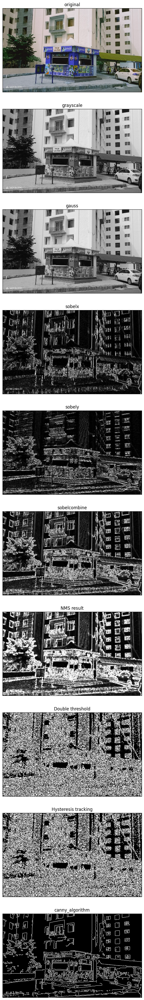

In [6]:
#we are going to use canny edge and by using this we are going to do these operation on our image:
# 1. noise reduction;
# 2.Gradient calculation;
# 3. Non-maximum suppression;
# 4.Double threshold;
# 5. Edge Tracking by Hysteresis.

#-------------------------------------------------------------reading image and converting in grayscale---------------------------------

import cv2
import numpy as np
img=cv2.imread("canteen.jpeg",1)  #loading images

img2=cv2.imread("canteen.jpeg",0)

img=cv2.resize(img,(500,300))  #resizing the images
img2=cv2.resize(img2,(500,300))

#showing images
cv2.imshow("original",img) 
cv2.imshow("Grayscaledimage",img2)
#-------------------------------------------------------------Noise-reduction--------------------------------

#Firstly we will do noise reduction from images using canny edge algorithm which use the GAUSSIAN Blur function
#GAUSSIAN blur - it uses different weight kernel,in row as well as column--means side values are small then centre.
#it manages distance between pixels
gaussian=cv2.GaussianBlur(img2,(1,1),0)
cv2.imshow("Gaussian applied",gaussian)

#-------------------------------------------------------------Gradient--calculation---------------------------------
#now we are going to calculate gradient by using sobelx and sobel y
sobelx=cv2.Sobel(img2,cv2.CV_64F,1,0,ksize=3)
sobely=cv2.Sobel(img2,cv2.CV_64F,0,1,ksize=3)
sobelx=np.uint8(np.absolute(sobelx))
sobely=np.uint8(np.absolute(sobely))
sobelcombine=cv2.bitwise_or(sobelx,sobely)
cv2.imshow("sobelx",sobelx)
cv2.imshow("sobely",sobely)
cv2.imshow("combined sobel",sobelcombine)

# Calculate gradient magnitude
gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

# Calculate gradient direction (in degrees)
gradient_direction = np.arctan2(sobelx, sobely) * 180 / np.pi

print("The gradient magnitude of image: ",gradient_magnitude)
print("The gradient direction of image :",gradient_direction)


#-------------------------------------------------------------NMS(non maximal supression)---------------------------------

#now for NMS (non-maximal supression) we have inbuilt function of open cv called DILATE()
# NMS we do it to The main purpose of non-maximal suppression is to retain only the most significant or dominant responses 
#while suppressing or eliminating weaker or redundant responses.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)) 
NMS_img=cv2.dilate(sobelcombine, kernel, iterations=1)

cv2.imshow("NMS Result", NMS_img)

#-------------------------------------------------------------double threshold---------------------------------
#4. double threshhold
# use to distinguish between strong edges and weak edges in an edge map or gradient magnitude image.
low_threshold = 10  
upper_threshold = 50 

# Create a binary image where strong edges are white and weak edges are gray
strong_edges = (gradient_magnitude >= upper_threshold)
weak_edges = (gradient_magnitude >= low_threshold) & (gradient_magnitude < upper_threshold)
edge_map0 = np.zeros_like(NMS_img)
edge_map0[strong_edges] = 150  # Strong edges in white
edge_map0[weak_edges] = 50    # Weak edges in gray
cv2.imshow('Double threshold', edge_map0)

#-------------------------------------------------------------hysteresis--tracking---------------------------------

 #Hysteresis thresholding works by considering the strength of edges and their connectivity in the image
def tracking_hysteresis(edge_map0, strong_edges, weak_edges):
    rows, cols = edge_map0.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if edge_map0[i, j] == 128:  # Check if it's a weak edge pixel
                # Check the 8 neighboring pixels for strong edges
                if np.any(strong_edges[i - 1:i + 2, j - 1:j + 2]):
                    edge_map0[i, j] = 255  # Promote the weak edge to a strong edge

# Apply hysteresis thresholding to connect weak edges to strong edges
tracking_hysteresis(edge_map0, strong_edges, weak_edges)

# Display the original image and the resulting edge map
cv2.imshow("hysteresis tracking", edge_map0)

#------------------------------------------------------------- canny algorithm ---------------------------------------------------------
canny_image=cv2.Canny(img2,150,255)
#-------------------------------------------------------------ploting images---------------------------------


titles=["original","grayscale","gauss","sobelx","sobely","sobelcombine","NMS result","Double threshold","Hysteresis tracking","canny_algorithm"]
images=[img,img2,gaussian,sobelx,sobely,sobelcombine,NMS_img,edge_map0,edge_map0,canny_image]
#now plot all images in a graph
fig_width=50
fig_height=50
from matplotlib import pyplot as plt
plt.figure(figsize=(fig_width, fig_height))
for i in range(10):
   #plt.figure(figsize=(fig_width, fig_height))
   plt.subplot(10,1,i+1),
   plt.imshow(images[i],'gray')
   plt.title(titles[i])
   plt.xticks([]),plt.yticks([])
plt.show()
cv2.waitKey(10)
cv2.destroyAllWindows()


The gradient magnitude of image:  [[ 0.     0.     0.    ...  8.    12.     0.   ]
 [ 0.     0.     0.    ... 15.03  15.81  10.   ]
 [ 0.     0.     0.    ...  9.9   14.766 14.   ]
 ...
 [ 2.     4.473  4.473 ...  3.162 11.4    2.   ]
 [ 4.     5.656  5.656 ...  7.21  11.4    6.   ]
 [ 0.     4.     4.    ...  6.     8.     0.   ]]
The gradient direction of image : [[ 0.     0.     0.    ... 90.    90.     0.   ]
 [ 0.     0.     0.    ... 30.1    1.081  0.   ]
 [ 0.     0.     0.    ... 27.27  30.45   0.   ]
 ...
 [ 0.    63.47  63.47  ... 18.44  74.8    0.   ]
 [ 0.    45.    45.    ... 33.7   52.12   0.   ]
 [ 0.    90.    90.    ... 90.    90.     0.   ]]


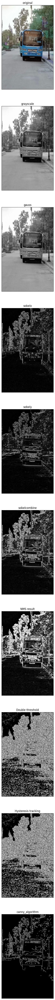

In [8]:
#we are going to use canny edge and by using this we are going to do these operation on our image:
# 1. noise reduction;
# 2.Gradient calculation;
# 3. Non-maximum suppression;
# 4.Double threshold;
# 5. Edge Tracking by Hysteresis.

#-------------------------------------------------------------reading image and converting in grayscale---------------------------------

import cv2
import numpy as np
img=cv2.imread("bus.jpeg",1)  #loading images

img2=cv2.imread("bus.jpeg",0)

img=cv2.resize(img,(500,800))  #resizing the images
img2=cv2.resize(img2,(500,800))

#showing images
cv2.imshow("original",img) 
cv2.imshow("Grayscaledimage",img2)
#-------------------------------------------------------------Noise-reduction--------------------------------

#Firstly we will do noise reduction from images using canny edge algorithm which use the GAUSSIAN Blur function
#GAUSSIAN blur - it uses different weight kernel,in row as well as column--means side values are small then centre.
#it manages distance between pixels
gaussian=cv2.GaussianBlur(img2,(1,1),0)
cv2.imshow("Gaussian applied",gaussian)

#-------------------------------------------------------------Gradient--calculation---------------------------------
#now we are going to calculate gradient by using sobelx and sobel y
sobelx=cv2.Sobel(img2,cv2.CV_64F,1,0,ksize=3)
sobely=cv2.Sobel(img2,cv2.CV_64F,0,1,ksize=3)
sobelx=np.uint8(np.absolute(sobelx))
sobely=np.uint8(np.absolute(sobely))
sobelcombine=cv2.bitwise_or(sobelx,sobely)
cv2.imshow("sobelx",sobelx)
cv2.imshow("sobely",sobely)
cv2.imshow("combined sobel",sobelcombine)

# Calculate gradient magnitude
gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)

# Calculate gradient direction (in degrees)
gradient_direction = np.arctan2(sobelx, sobely) * 180 / np.pi

print("The gradient magnitude of image: ",gradient_magnitude)
print("The gradient direction of image :",gradient_direction)


#-------------------------------------------------------------NMS(non maximal supression)---------------------------------

#now for NMS (non-maximal supression) we have inbuilt function of open cv called DILATE()
# NMS we do it to The main purpose of non-maximal suppression is to retain only the most significant or dominant responses 
#while suppressing or eliminating weaker or redundant responses.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2)) 
NMS_img=cv2.dilate(sobelcombine, kernel, iterations=1)

cv2.imshow("NMS Result", NMS_img)

#-------------------------------------------------------------double threshold---------------------------------
#4. double threshhold
# use to distinguish between strong edges and weak edges in an edge map or gradient magnitude image.
low_threshold = 10  
upper_threshold = 50 

# Create a binary image where strong edges are white and weak edges are gray
strong_edges = (gradient_magnitude >= upper_threshold)
weak_edges = (gradient_magnitude >= low_threshold) & (gradient_magnitude < upper_threshold)
edge_map0 = np.zeros_like(NMS_img)
edge_map0[strong_edges] = 150  # Strong edges in white
edge_map0[weak_edges] = 50    # Weak edges in gray
cv2.imshow('Double threshold', edge_map0)

#-------------------------------------------------------------hysteresis--tracking---------------------------------

 #Hysteresis thresholding works by considering the strength of edges and their connectivity in the image
def tracking_hysteresis(edge_map0, strong_edges, weak_edges):
    rows, cols = edge_map0.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if edge_map0[i, j] == 128:  # Check if it's a weak edge pixel
                # Check the 8 neighboring pixels for strong edges
                if np.any(strong_edges[i - 1:i + 2, j - 1:j + 2]):
                    edge_map0[i, j] = 255  # Promote the weak edge to a strong edge

# Apply hysteresis thresholding to connect weak edges to strong edges
tracking_hysteresis(edge_map0, strong_edges, weak_edges)

# Display the original image and the resulting edge map
cv2.imshow("hysteresis tracking", edge_map0)

#------------------------------------------------------------- canny algorithm ---------------------------------------------------------
canny_image=cv2.Canny(img2,150,255)
#-------------------------------------------------------------ploting images---------------------------------


titles=["original","grayscale","gauss","sobelx","sobely","sobelcombine","NMS result","Double threshold","Hysteresis tracking","canny_algorithm"]
images=[img,img2,gaussian,sobelx,sobely,sobelcombine,NMS_img,edge_map0,edge_map0,canny_image]
#now plot all images in a graph
fig_width=50
fig_height=80
from matplotlib import pyplot as plt
plt.figure(figsize=(fig_width, fig_height))
for i in range(10):
   #plt.figure(figsize=(fig_width, fig_height))
   plt.subplot(10,1,i+1),
   plt.imshow(images[i],'gray')
   plt.title(titles[i])
   plt.xticks([]),plt.yticks([])
plt.show()
cv2.waitKey(10)
cv2.destroyAllWindows()
